# Networks: structure, evolution & processes
**Internet Analytics - Lab 2**

---

**Group:** *B*

**Names:**

* *Keijiro Tajima*
* *Mahammad Shirinov*
* *Stephen Zhao*

---

#### Instructions

*This is a template for part 3 of the lab. Clearly write your answers, comments and interpretations in Markodown cells. Don't forget that you can add $\LaTeX$ equations in these cells. Feel free to add or remove any cell.*

*Please properly comment your code. Code readability will be considered for grading. To avoid long cells of codes in the notebook, you can also embed long python functions and classes in a separate module. Don’t forget to hand in your module if that is the case. In multiple exercises, you are required to come up with your own method to solve various problems. Be creative and clearly motivate and explain your methods. Creativity and clarity will be considered for grading.*

---

## 2.3 Epdemics

#### Exercise 2.9: Simulate an epidemic outbreak

In [1]:
# ... WRITE YOUR CODE HERE...

import json
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx
import epidemics_helper

nyc_augmented_network_json = open("../data/nyc_augmented_network.json", "r")
data = json.load(nyc_augmented_network_json)

data_nodes = []
data_pos = {}
data_edges = []

# make a list of nodes and  a dictionary of positions
for dic in data['nodes']:
    data_nodes.append(dic['id'])
    data_pos[dic['id']] = dic['coordinates']
    
# make edges list
for dic in data['links']:
    data_edges.append((dic['source'], dic['target']))
    
G1 = nx.Graph()
G1.add_nodes_from(data_nodes)
G1.add_edges_from(data_edges)

### 1. The first infection was observed at node 23654. Simulate the Plague epidemic with the aforementioned parameters for 100 days.

In [2]:
# Simulate the Plague epidemic
sir = epidemics_helper.SimulationSIR(G1, beta=10.0, gamma=0.1)
sir.launch_epidemic(source=23654, max_time=100.0)

Epidemic stopped after 118.69 days | 118.69 days elapsed | 0.1% susceptible, 0.0% infected, 99.9% recovered


### 2. Plot the evolution of the epidemic over time. In particular, plot the percentage of susceptible, infected and recovered nodes over time.

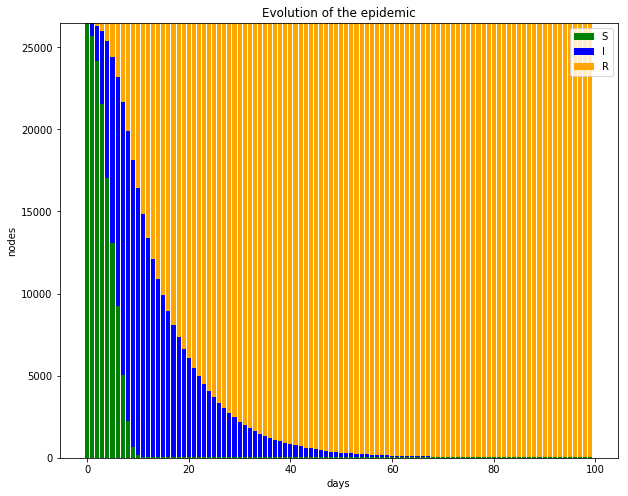

In [3]:
# make a ４ rows 100 columns matrix.  
# Rows correspond to numbers of day, S nodes, I nodes and R nodes.
numbers_SIR = np.zeros((4, 100), dtype = 'int') 
numbers_SIR[0] = np.arange(100) 

for day in numbers_SIR[0]:
    for node in data_nodes:
        if sir.inf_time[node] > day:
            numbers_SIR[1, day] += 1 # add 1 to numbers of S
        elif sir.inf_time[node]  <= day and day < sir.rec_time[node]:
            numbers_SIR[2, day] += 1 # add 1 to numbers of I
        else:
            numbers_SIR[3, day] += 1 # add 1 to numbers of R

# plotting
plt.figure(figsize=(10, 8))
plt.bar(numbers_SIR[0], numbers_SIR[1], color = 'green', label = "S")
plt.bar(numbers_SIR[0], numbers_SIR[2], bottom = numbers_SIR[1], color = 'blue', label = "I")
plt.bar(numbers_SIR[0], numbers_SIR[3], bottom = numbers_SIR[1] + numbers_SIR[2], color = 'orange', label = "R")
plt.title("Evolution of the epidemic")
plt.xlabel("days")
plt.ylabel("nodes")
plt.legend()

### 3. How long does it take before 60% of the population is infected? dead?

In [4]:
is_dead = False
is_infected = False
is_infected_or_dead = False
for day in numbers_SIR[0]:
    if (numbers_SIR[2][day]) / len(data_nodes) >= 0.6 and not is_infected:
        print("It takes {} days　before 60% of the population is infeceted.".format(day))
        is_infected = True
    if (numbers_SIR[3][day]) / len(data_nodes) >= 0.6 and not is_dead:
        print("It takes {} days　before 60% of the population is dead.".format(day))
        is_dead = True
    if (numbers_SIR[2][day] + numbers_SIR[3][day]) / len(data_nodes) >= 0.6 and not is_infected_or_dead:
        print("It takes {} days　before 60% of the population is infeceted or dead.".format(day))
        is_infected_or_dead = True

It takes 6 days　before 60% of the population is infeceted or dead.
It takes 7 days　before 60% of the population is infeceted.
It takes 15 days　before 60% of the population is dead.


### 4. Use the coordinates of the nodes to visualize the graph. Show susceptible, infected and recovered nodes in different colors to differentiate them. How does the graph look like after 1 day? 3 days? 30 days?

In [5]:
def draw(day, graph, axisoff='off'):
    color_map = []
    for node in data_nodes:
        if sir.inf_time[node] > day:
            color_map.append('blue') # S nodes are blue
        elif sir.inf_time[node]  <= day and day < sir.rec_time[node]:
            color_map.append('red') # I nodes are red
        else:
            color_map.append('green') # R nodes are green
    plt.figure(figsize=(12, 12))
    nx.draw(graph, pos=data_pos, node_color = color_map, with_labels = False, node_size = 1, width=0.5) 
    plt.axis(axisoff)

### Graph after 1 day. (S: blue, I: red, R: green)

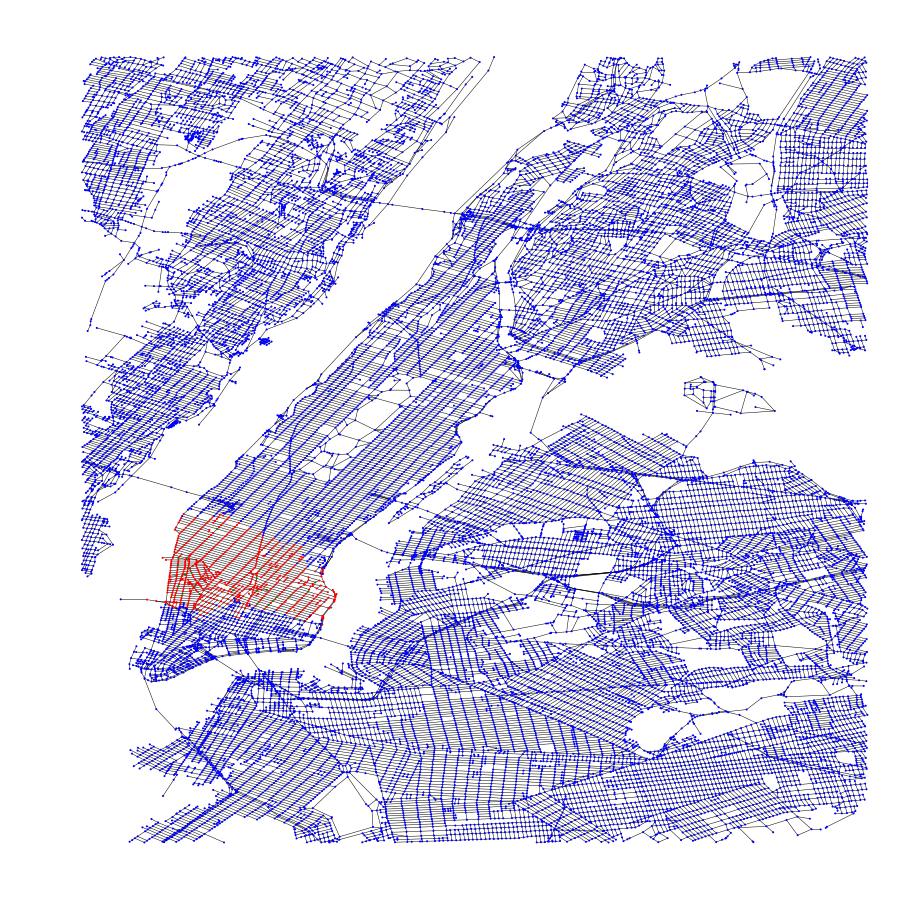

In [6]:
draw(1, G1)

### Graph after 3 day. (S: blue, I: red, R: green)

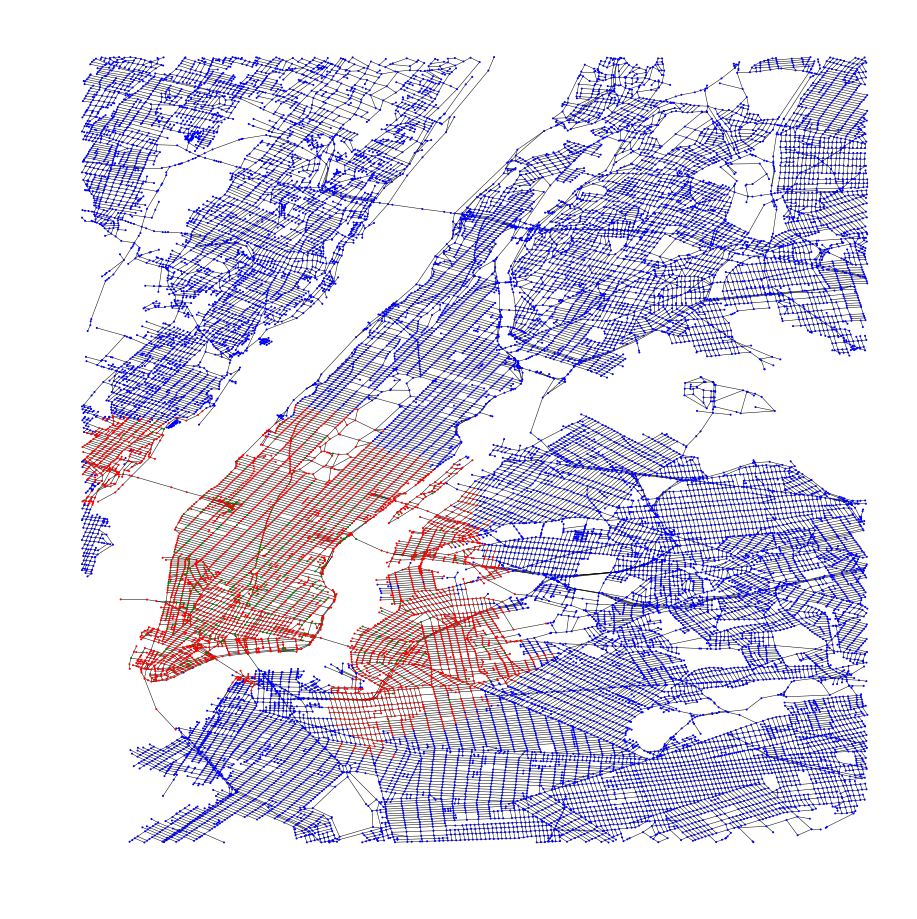

In [7]:
draw(3, G1)

### Graph after 30 day. (S: blue, I: red, R: green)

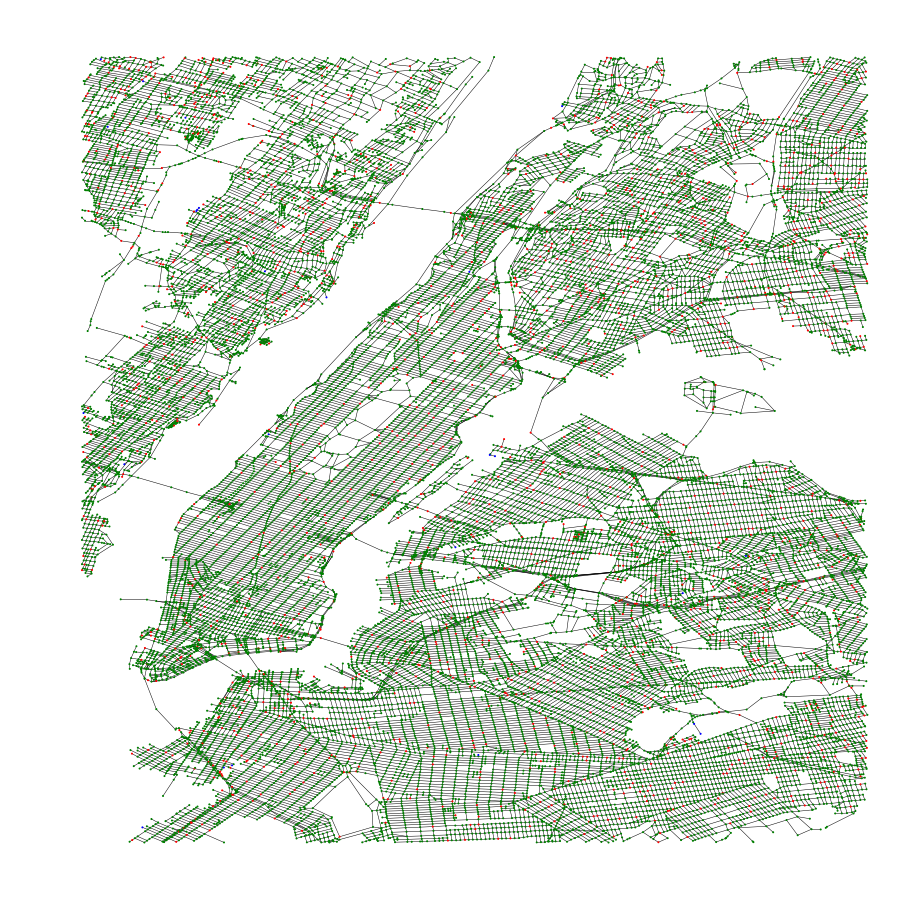

In [8]:
draw(30, G1)

---

### 2.3.1 Stop the apocalypse!

#### Exercise 2.10: Strategy 1

### • Implement this strategy with a budget of 1000 edges to remove.
### • Simulate the epidemic multiple times with the same parameters, i.e. β = 10.0 andγ = 0.1, starting from randomly selected source nodes.

In [9]:
import random

data_edges2 = random.sample(data_edges, len(data_edges)-1000)

G2 = nx.Graph()
G2.add_nodes_from(data_nodes)
G2.add_edges_from(data_edges2)

sir = epidemics_helper.SimulationSIR(G2, beta=10.0, gamma=0.1)
sir.launch_epidemic(source = random.sample(data_nodes, 1)[0], max_time=100.0)

Epidemic stopped after 101.34 days | 101.34 days elapsed | 0.3% susceptible, 0.0% infected, 99.7% recovered


### Graph after 1 day. (S: blue, I: red, R: green)

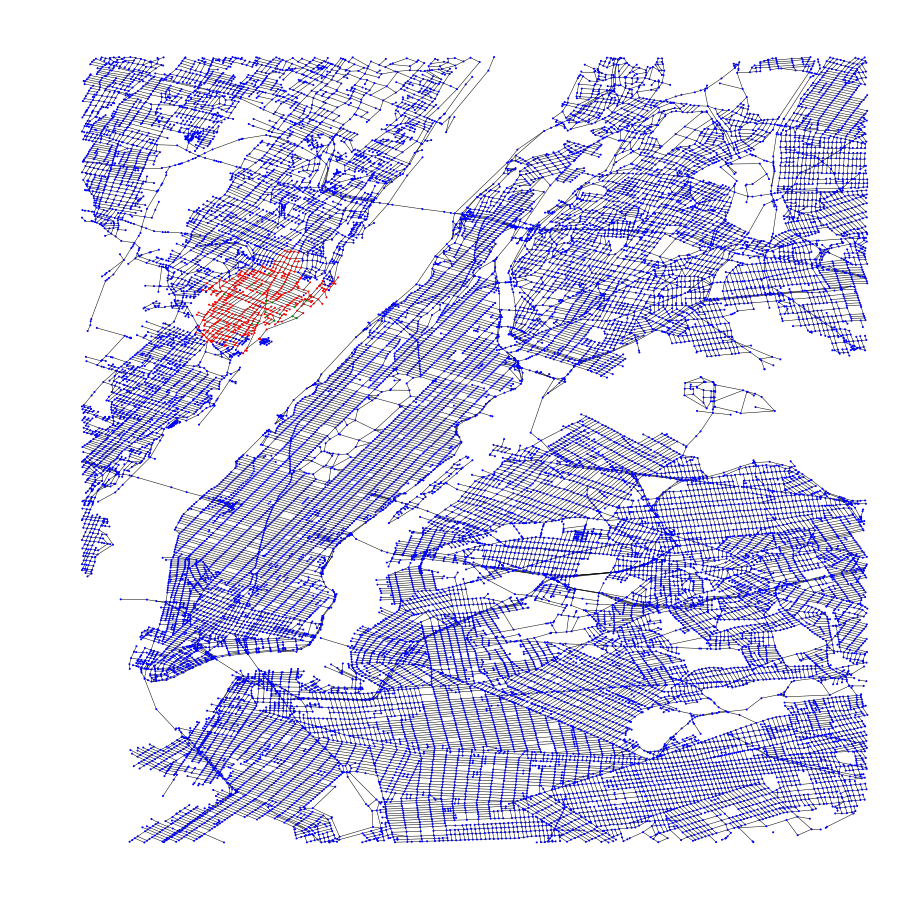

In [10]:
draw(1, G2)

### Graph after 3 day. (S: blue, I: red, R: green)

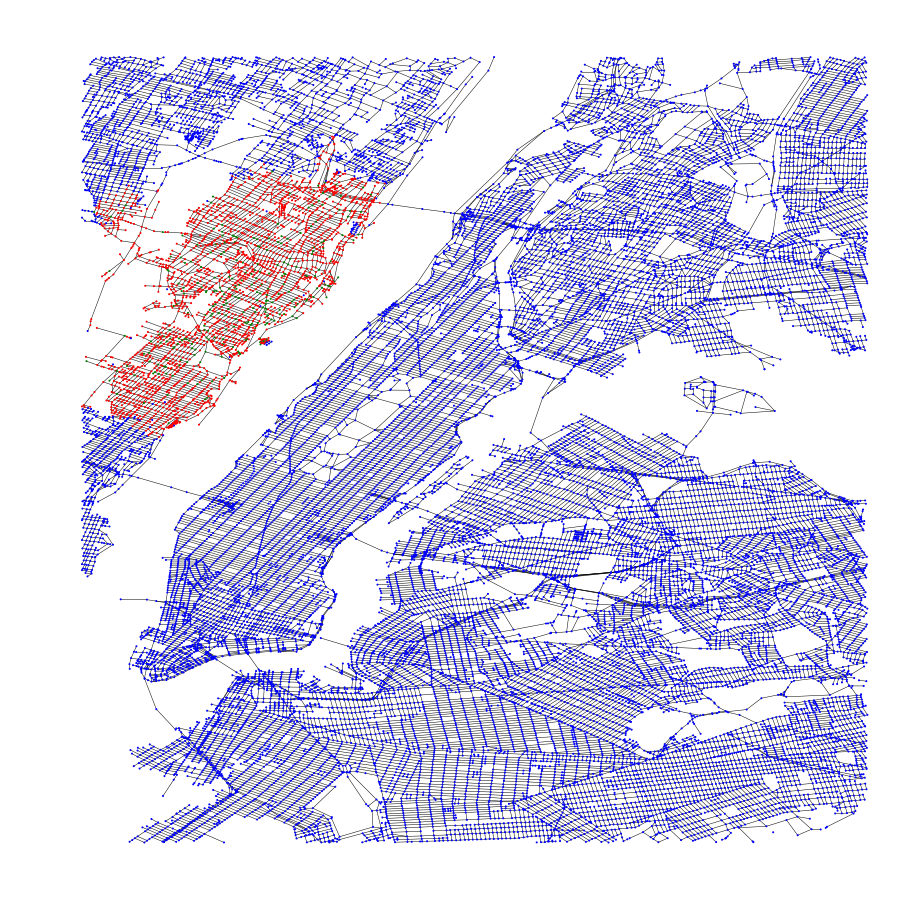

In [11]:
draw(3, G2)

### Graph after 30 day. (S: blue, I: red, R: green)

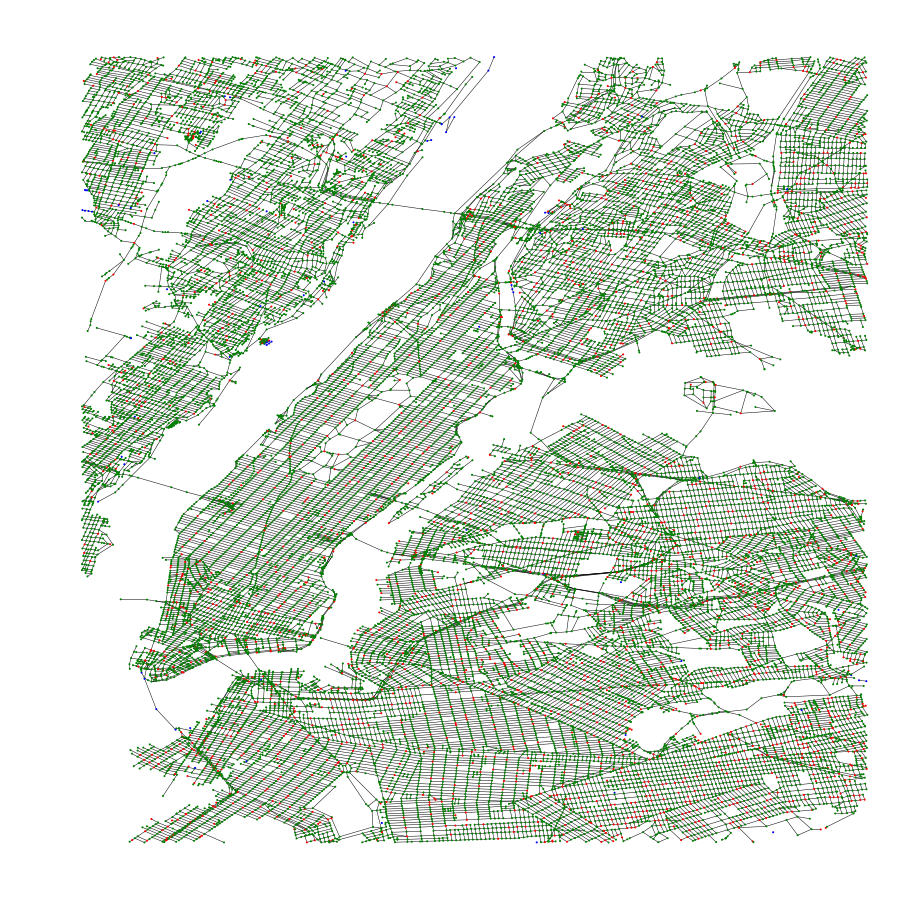

In [12]:
draw(30, G2)

### • Is this strategy effective? >> Not at all, because the ratio of susceptilbe nodes are too low, less than 1%.

### • On average, how many people are healthy, infected, dead after 30 days?

In [13]:
# make three lists correspond to S, I and R. Append them for repeat times. 
S, I, R = [], [], []
repeat_time = 10
sir = epidemics_helper.SimulationSIR(G2, beta=10.0, gamma=0.1)

for i in range(repeat_time): # repeat for repeat_times
    sir.launch_epidemic(source = random.sample(data_nodes, 1)[0], max_time=100.0)
    s, i, r = 0, 0, 0 # s, i, r are the numbers of nodes at ith repeatment.
    for node in data_nodes:
        if sir.inf_time[node] > 30:
            s += 1
        elif sir.inf_time[node]  <= 30 and 30 < sir.rec_time[node]:
            i += 1
        else:
            r += 1
    S.append(s)
    I.append(i)
    R.append(r)

print("average of healthy, infected, dead after 30 days= {}".format([sum(S) / len(S), sum(I) / len(I), sum(R) / len(I)]))
print("manage to keep {}% of healthy nodes in average after 30 days".format(sum(S) / len(S) / len(data_nodes)*100))

Epidemic stopped after 111.87 days | 111.87 days elapsed | 0.8% susceptible, 0.0% infected, 99.2% recovered
Epidemic stopped after 101.30 days | 101.30 days elapsed | 0.4% susceptible, 0.0% infected, 99.6% recovered
Epidemic stopped after 100.80 days | 100.80 days elapsed | 0.4% susceptible, 0.0% infected, 99.6% recovered
Epidemic stopped after 101.95 days | 101.95 days elapsed | 0.3% susceptible, 0.0% infected, 99.7% recovered
Epidemic stopped after 101.01 days | 101.01 days elapsed | 0.3% susceptible, 0.0% infected, 99.7% recovered
Epidemic stopped after 105.02 days | 105.02 days elapsed | 0.3% susceptible, 0.0% infected, 99.7% recovered
Epidemic stopped after 111.23 days | 111.23 days elapsed | 0.3% susceptible, 0.0% infected, 99.7% recovered
Epidemic stopped after 97.02 days | 97.02 days elapsed | 0.4% susceptible, 0.0% infected, 99.6% recovered
Epidemic stopped after 102.17 days | 102.17 days elapsed | 0.4% susceptible, 0.0% infected, 99.6% recovered
Epidemic stopped after 103.86 

### manage to keep 0.40% of healthy nodes in average after 30 days

#### Exercise 2.11: Strategy 2

### Strategy: First, find the nodes which have two degrees of edges. Then remove one of the edges of those nodes.

In [14]:
G3 = nx.Graph()
G3.add_nodes_from(data_nodes)
G3.add_edges_from(data_edges)

a = 0
for node in [node for node in G3.nodes if G3.degree(node) == 2]:
    if a >= 2500:
        break;
    neighbors = list(G3.neighbors(node))
    if len(neighbors) > 1:
        G3.remove_edge(node, neighbors[0])
        a += 1

In [15]:
S, I, R = [], [], []
repeat_time = 20
sir = epidemics_helper.SimulationSIR(G3, beta=10.0, gamma=0.1)

for i in range(repeat_time):
    sir.launch_epidemic(source = random.sample(data_nodes, 1)[0], max_time=100.0)
    s, i, r = 0, 0, 0
    for node in data_nodes:
        if sir.inf_time[node] > 30:
            s += 1
        elif sir.inf_time[node]  <= 30 and 30 < sir.rec_time[node]:
            i += 1
        else:
            r += 1
    S.append(s)
    I.append(i)
    R.append(r)

print("average of healthy, infected, dead after 30 days= {}".format([sum(S) / len(S), sum(I) / len(I), sum(R) / len(I)]))
print("manage to keep {}% of healthy nodes in average after 30 days".format(sum(S) / len(S) / len(data_nodes)*100))

Epidemic stopped after 56.97 days | 56.97 days elapsed | 97.7% susceptible, 0.0% infected, 2.3% recovered
Epidemic stopped after 132.32 days | 132.32 days elapsed | 56.9% susceptible, 0.0% infected, 43.1% recovered
Epidemic stopped after 113.51 days | 113.51 days elapsed | 56.8% susceptible, 0.0% infected, 43.2% recovered
Epidemic stopped after 96.24 days | 96.24 days elapsed | 88.9% susceptible, 0.0% infected, 11.1% recovered
Epidemic stopped after 90.58 days | 90.58 days elapsed | 56.8% susceptible, 0.0% infected, 43.2% recovered
Epidemic stopped after 106.32 days | 106.32 days elapsed | 56.8% susceptible, 0.0% infected, 43.2% recovered
Epidemic stopped after 89.64 days | 89.64 days elapsed | 94.7% susceptible, 0.0% infected, 5.3% recovered
Epidemic stopped after 87.36 days | 87.36 days elapsed | 83.7% susceptible, 0.0% infected, 16.3% recovered
Epidemic stopped after 109.92 days | 109.92 days elapsed | 83.7% susceptible, 0.0% infected, 16.3% recovered
Epidemic stopped after 85.47 da

### manage to keep about 75% of healthy nodes in average after 30 days

### Graph after 30 day. (S: blue, I: red, R: green)

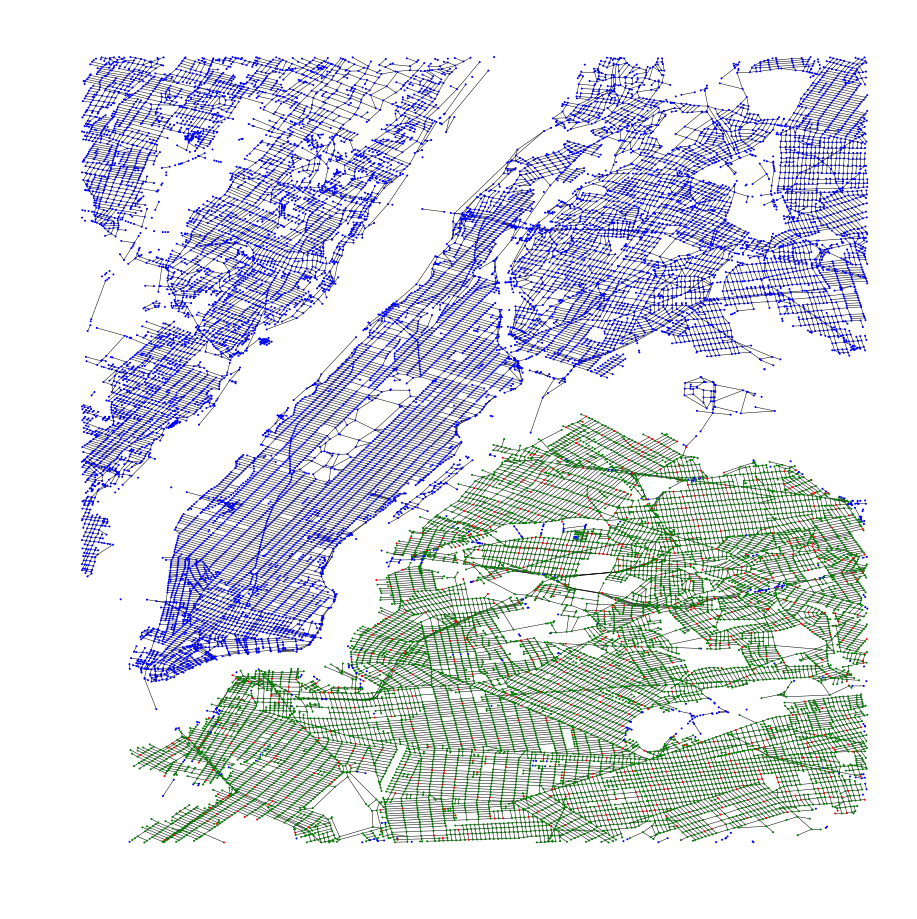

In [16]:
draw(30, G3)